# Here's Waldo

##### Much of this code was inspired by a [notebook](https://ui.neptune.ai/anton-morgunov/tf-test/n/model-for-inference-36c9b0c4-8d20-4d5a-aa54-5240cc8ce764/6f67c0e3-283c-45de-ae56-405aecd736c0) by Anton Morgunov.
##### Additional credit goes to the authors of the [Tensorflow Object Detection API Tutorial](https://tensorflow-object-detection-api-tutorial.readthedocs.io/)

In [1]:
import tensorflow as tf
import numpy as np
from PIL import Image
from matplotlib import pyplot as plt
from tqdm import tqdm
import os

In [2]:
import sys
path2scripts = 'models/research/'
sys.path.insert(0, path2scripts)

In [3]:
from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder

Before training the model you need to have labelled image data. I used [labelimg](https://github.com/tzutalin/labelImg), but there are others available. As you label your images and save them an .xml file is created along with each image.

Once all images are labelled you can split them up into train, test, and validation folders along with their .xml files. Then run the generate_tfrecord.py script found in the workspace directory of this github repo. 

(Code credit: Tensorflow Object Detection API Tutorial)

**Uncommment the cell below to create the `train.record` file**

In [4]:
# %%bash
# cd workspace
# python generate_tfrecord.py -x ./data_rev1/train -l ./data_rev1/annotations/label_map.pbtxt -o ./data_rev1/annotations/train.record

**Uncommment the cell below to create the `test.record` file**

In [5]:
# %%bash
# cd workspace
# python generate_tfrecord.py -x ./data_rev1/test -l ./data_rev1/annotations/label_map.pbtxt -o ./data_rev1/annotations/test.record

**Uncommment the cell below to create the `validate.record` file**

In [6]:
# %%bash
# cd workspace
# python generate_tfrecord.py -x ./data_rev1/validate -l ./data_rev1/annotations/label_map.pbtxt -o ./data_rev1/annotations/validate.record

### Training a model

Once you have your .tfrecord files for each of your train, test, and validate images, then you are ready to start training a model.

You will need to choose a model to train from the [Tensorflow 2 Model Zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md) and download that into a directory. 

**Uncomment this cell to download efficientdet_d0 model into workspace/pre_trained_models directory**

In [8]:
# %%bash
# cd workspace/pre_trained_models
# wget http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d7_coco17_tpu-32.tar.gz
# ;

**Uncomment the cell below to extract all files from the downloaded model and delete the zip file.**

In [11]:
# %%bash 
# cd workspace/pre_trained_models
# tar -xf efficientdet_d7_coco17_tpu-32.tar.gz
# rm efficientdet_d7_coco17_tpu-32.tar.gz

Next we will need to copy the pipeline file from within the folder we just downloaded into a new directory that we will set up to train our model

**Uncomment the cell below to copy the pipeline.config file from our downloaded model to a new directory that will house the files for our re-trained model.**

In [12]:
%%bash
mkdir workspace/models/efficientdet_d7_v1
cp workspace/pre_trained_models/efficientdet_d7_coco17_tpu-32/pipeline.config \
workspace/models/efficientdet_d7_v1/pipeline.config

**Uncomment the cell below to change directories into the new directory for your trainable model**

In [42]:
%cd models/mask_rcnn_model_1/

/Users/scotthines/RPT/assignments/here_is_waldo/tensorflow/workspace/models/mask_rcnn_model_1


The cell below takes some steps to complete and is the key to the whole process. 

1. If you haven't loaded the config file them run the `%load pipeline.config` line first.
2. Once the pipeline file is loaded you can edit it based on your desired configuration. I have added comments on all of the lines that I have changed for this initial training.
3. Once you are satisfied with the edits to the config file, uncomment the `%%writefile pipeline.config` line to overwrite the file with your edits. 

In [44]:
%%writefile pipeline.config
# %load pipeline.config
# Mask R-CNN with Inception Resnet v2 (no atrous)
# Sync-trained on COCO (with 8 GPUs) with batch size 16 (1024x1024 resolution)
# Initialized from Imagenet classification checkpoint
# TF2-Compatible, *Not* TPU-Compatible
#
# Achieves XXX mAP on COCO

model {
  faster_rcnn {
    number_of_stages: 3
    num_classes: 1
    image_resizer {
      fixed_shape_resizer {
        height: 1024
        width: 1024
        # pad_to_max_dimension: true
      }
    }
    feature_extractor {
      type: 'faster_rcnn_inception_resnet_v2_keras'
    }
    first_stage_anchor_generator {
      grid_anchor_generator {
        scales: [0.25, 0.5, 1.0, 2.0]
        aspect_ratios: [0.5, 1.0, 2.0]
        height_stride: 16
        width_stride: 16
      }
    }
    first_stage_box_predictor_conv_hyperparams {
      op: CONV
      regularizer {
        l2_regularizer {
          weight: 0.0
        }
      }
      initializer {
        truncated_normal_initializer {
          stddev: 0.01
        }
      }
    }
    first_stage_nms_score_threshold: 0.0
    first_stage_nms_iou_threshold: 0.7
    first_stage_max_proposals: 300
    first_stage_localization_loss_weight: 2.0
    first_stage_objectness_loss_weight: 1.0
    initial_crop_size: 17
    maxpool_kernel_size: 1
    maxpool_stride: 1
    second_stage_box_predictor {
      mask_rcnn_box_predictor {
        use_dropout: false
        dropout_keep_probability: 1.0
        fc_hyperparams {
          op: FC
          regularizer {
            l2_regularizer {
              weight: 0.0
            }
          }
          initializer {
            variance_scaling_initializer {
              factor: 1.0
              uniform: true
              mode: FAN_AVG
            }
          }
        }
        mask_height: 33
        mask_width: 33
        mask_prediction_conv_depth: 0
        mask_prediction_num_conv_layers: 4
        conv_hyperparams {
          op: CONV
          regularizer {
            l2_regularizer {
              weight: 0.0
            }
          }
          initializer {
            truncated_normal_initializer {
              stddev: 0.01
            }
          }
        }
        predict_instance_masks: true
      }
    }
    second_stage_post_processing {
      batch_non_max_suppression {
        score_threshold: 0.0
        iou_threshold: 0.6
        max_detections_per_class: 100
        max_total_detections: 100
      }
      score_converter: SOFTMAX
    }
    second_stage_localization_loss_weight: 2.0
    second_stage_classification_loss_weight: 1.0
    second_stage_mask_prediction_loss_weight: 4.0
    resize_masks: false
  }
}

train_config: {
  batch_size: 8
  num_steps: 1000
  optimizer {
    momentum_optimizer: {
      learning_rate: {
        cosine_decay_learning_rate {
          learning_rate_base: 0.008
          total_steps: 200000
          warmup_learning_rate: 0.0
          warmup_steps: 5000
        }
      }
      momentum_optimizer_value: 0.9
    }
    use_moving_average: false
  }
  gradient_clipping_by_norm: 10.0
  fine_tune_checkpoint: './pre_trained_models/mask_rcnn_inception_resnet_v2_1024x1024_coco17_gpu-8/checkpoint/ckpt-0"
  data_augmentation_options {
    random_horizontal_flip {
    }
  }
}

train_input_reader: {
  tf_record_input_reader {
    input_path: "./data_rev1/annotations/train.record"
  }
  load_instance_masks: true
  mask_type: PNG_MASKS
}

eval_config: {
  metrics_set: "coco_detection_metrics"
  metrics_set: "coco_mask_metrics"
  eval_instance_masks: true
  use_moving_averages: false
  batch_size: 1
  include_metrics_per_category: true
}

eval_input_reader: {
  label_map_path: "./data/annotations/label_map.txt"
  shuffle: false
  num_epochs: 1
  tf_record_input_reader {
    input_path: "./data/annotations/validate.record"
  }
  load_instance_masks: true
  mask_type: PNG_MASKS
}


Overwriting pipeline.config


Now we have everything that we need to run our `model_main_tf2.py` file. Which for me is located in the workspace directory.

**Uncomment the cell below to change directories back to the workflow directory where our `model_main_tf2.py` file is housed.**

In [45]:
 %cd ../..

/Users/scotthines/RPT/assignments/here_is_waldo/tensorflow/workspace


The cell below re-trains our model based on our new input. This will take a long time to run and will not give you any indication of the progress. See below on instructions for how to open the Tenorboard and monitor the status of your training. 

**Uncomment the cell below to re-train our model.**

In [40]:
%%bash
python model_main_tf2.py \
  --pipeline_config_path=./models/mask_rcnn_model_1/pipeline.config \
  --model_dir=./models/efficientdet_d7_v1 \
  --checkpoint_every_n=25 \
  --num_workers=4 \
  --alsologtostderr
;

Instructions for updating:
use distribute.MultiWorkerMirroredStrategy instead
W0328 22:14:07.238246 4692856320 deprecation.py:339] From model_main_tf2.py:99: _CollectiveAllReduceStrategyExperimental.__init__ (from tensorflow.python.distribute.collective_all_reduce_strategy) is deprecated and will be removed in a future version.
Instructions for updating:
use distribute.MultiWorkerMirroredStrategy instead
2021-03-28 22:14:07.238570: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-03-28 22:14:07.238891: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
INFO:tensorflow:Using MirroredStrategy with devices ('/device:CPU:0',)
I0328 22:14:07.240591 4692856320 mirrored_s

CalledProcessError: Command 'b'python model_main_tf2.py \\\n  --pipeline_config_path=./models/efficientdet_d7_v1/pipeline.config \\\n  --model_dir=./models/efficientdet_d7_v1 \\\n  --checkpoint_every_n=25 \\\n  --num_workers=4 \\\n  --alsologtostderr\n;\n'' returned non-zero exit status 2.

While the cell above is running you can monitor the progress of your models training by opening up a terminal window and running the tensorboard command. The format looks something like this.

`tensorboard --logdir <dir of train folder created in the same folder as your edited pipeline>`

for me this looks like this from my workspace directory.

`tensorboard --logdir ./models/efficientdet_d0_v1/train`

Once you get that up and running then you can navigate to http://localhost:6006/ in your browser and see the tensorboard.

### Exporting our re-trained model

Now that our model has been trained we need to export it in order to make any inference on images that it hasn't seen. Run the cell below to export the trained model into a new directory holding our exported model.

-pipeline_config_path= `this is the path to the pipeline.config file you modified above`

-trained_checkpoint_dir= `this is the path to the directory with all of the ckpt files created during training`

-output_directory= `this is the path where you want your exported models to live`

-input_type= `leave this as image_tensor`

**Uncomment cell below to create a new folder in the exported_models directory and export your trained model into that directory**

In [65]:
%%bash
cd workspace
mkdir ./exported_models/efficientdet_d0_v1_data_rev1
python exporter_main_v2.py \
  --pipeline_config_path=./models/efficientdet_d0_v1_data_rev1/pipeline.config \
  --trained_checkpoint_dir=./models/efficientdet_d0_v1_data_rev1 \
  --output_directory=./exported_models/efficientdet_d0_v1_data_rev1 \
  --input_type=image_tensor
;

bash: line 1: cd: workspace: No such file or directory
2021-03-28 21:08:40.863707: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-03-28 21:08:40.867011: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
I0328 21:08:40.875880 4441374208 ssd_efficientnet_bifpn_feature_extractor.py:143] EfficientDet EfficientNet backbone version: efficientnet-b0
I0328 21:08:40.876054 4441374208 ssd_efficientnet_bifpn_feature_extractor.py:144] EfficientDet BiFPN num filters: 64
I0328 21:08:40.876103 4441374208 ssd_efficientnet_bifpn_feature_extractor.py:146] EfficientDet BiFPN num iterations: 3
I0328 21:08:40.880193 4441374208 efficientnet_model.py:147] round_filter input=32 output=

CalledProcessError: Command 'b'cd workspace\nmkdir ./exported_models/efficientdet_d0_v1_data_rev1\npython exporter_main_v2.py \\\n  --pipeline_config_path=./models/efficientdet_d0_v1_data_rev1/pipeline.config \\\n  --trained_checkpoint_dir=./models/efficientdet_d0_v1_data_rev1 \\\n  --output_directory=./exported_models/efficientdet_d0_v1_data_rev1 \\\n  --input_type=image_tensor\n;\n'' returned non-zero exit status 2.

### Making inference on previously unseen images

First we need to put our necessary paths into variables

In [66]:
path2config ='workspace/exported_models/efficientdet_d0_v1_data_rev1/pipeline.config'
path2model = 'workspace/exported_models/efficientdet_d0_v1_data_rev1/checkpoint'

Next we import our new model config and recreate it. Then we build our new model and put that into a variable. 

In [69]:
%cd ..

/Users/scotthines/RPT/assignments/here_is_waldo/tensorflow


In [70]:
configs = config_util.get_configs_from_pipeline_file(path2config)
model_config = configs['model'] 
detection_model = model_builder.build(model_config=model_config, is_training=False)

Next we restore the checkpoint we created

In [71]:
ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)
ckpt.restore(os.path.join(path2model, 'ckpt-0')).expect_partial()

We pass in our label map and use label_map_util to turn is into a category index  

In [72]:
path2label_map = 'workspace/data/annotations/label_map.pbtxt' 
category_index = label_map_util.create_category_index_from_labelmap(path2label_map,use_display_name=True)

The functions below now will allow us to visualize our image with a labelled bounding box over the top.

<mark> Code credit: Anton Murgonov </mark>

In [73]:
def detect_fn(image):
    """
    Detect objects in image.
    
    Args:
      image: (tf.tensor): 4D input image
      
    Returs:
      detections (dict): predictions that model made
    """

    image, shapes = detection_model.preprocess(image)
    prediction_dict = detection_model.predict(image, shapes)
    detections = detection_model.postprocess(prediction_dict, shapes)

    return detections

In [74]:
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
      path: the file path to the image

    Returns:
      numpy array with shape (img_height, img_width, 3)
    """
    
    return np.array(Image.open(path))

In [75]:
def inference_with_plot(path2images, box_th=0.25):
    """
    Function that performs inference and plots resulting b-boxes
    
    Args:
      path2images: an array with pathes to images
      box_th: (float) value that defines threshold for model prediction.
      
    Returns:
      None
    """
    for image_path in path2images:

        print('Running inference for {}... '.format(image_path), end='')

        image_np = load_image_into_numpy_array(image_path)
        
        input_tensor = tf.convert_to_tensor(np.expand_dims(image_np, 0), dtype=tf.float32)
        detections = detect_fn(input_tensor)

        # All outputs are batches tensors.
        # Convert to numpy arrays, and take index [0] to remove the batch dimension.
        # We're only interested in the first num_detections.
        num_detections = int(detections.pop('num_detections'))
        detections = {key: value[0, :num_detections].numpy()
                      for key, value in detections.items()}
        
        detections['num_detections'] = num_detections

        # detection_classes should be ints.
        detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

        label_id_offset = 1
        image_np_with_detections = image_np.copy()

        viz_utils.visualize_boxes_and_labels_on_image_array(
                image_np_with_detections,
                detections['detection_boxes'],
                detections['detection_classes']+label_id_offset,
                detections['detection_scores'],
                category_index,
                use_normalized_coordinates=True,
                max_boxes_to_draw=3,
                min_score_thresh=box_th,
                agnostic_mode=False,
                line_thickness=5)


        display(Image.fromarray(image_np_with_detections))

Running inference for waldo.jpeg... 

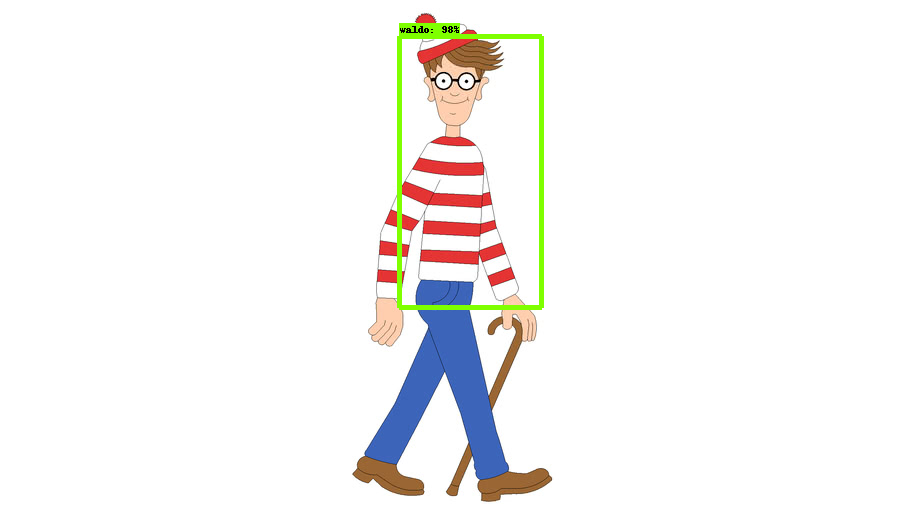

In [76]:
inference_with_plot(['waldo.jpeg'], box_th=.9)

Running inference for workspace/data/test/waldo1.jpg... 

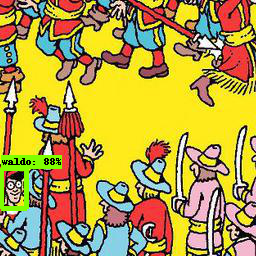

In [77]:
inference_with_plot(['workspace/data/test/waldo1.jpg'], box_th=.4)

Running inference for workspace/data/test/waldo108.jpg... 

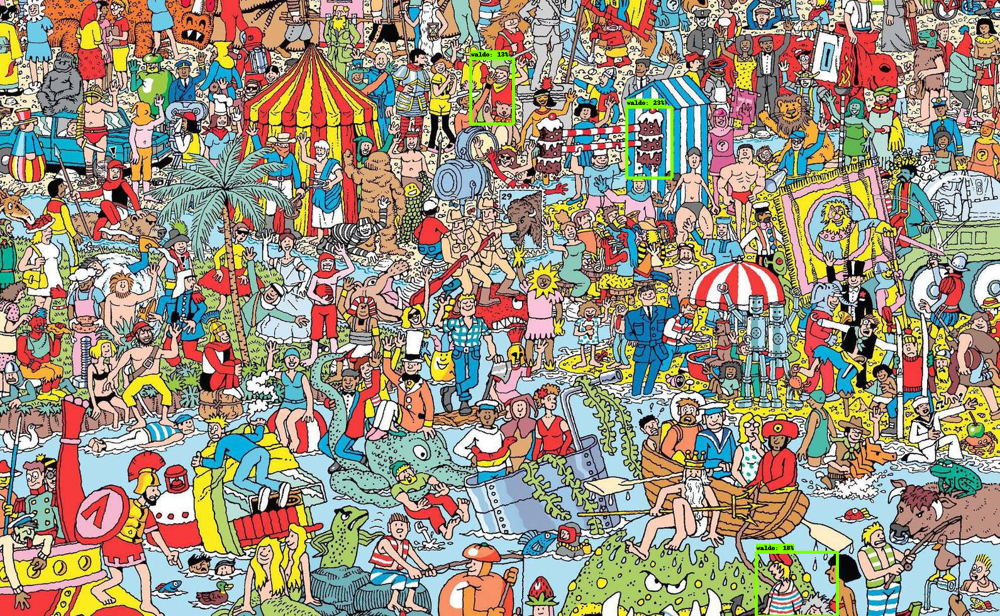

In [78]:
inference_with_plot(['workspace/data/test/waldo108.jpg'], box_th=.05)

Running inference for workspace/data/test/waldo109.jpg... 

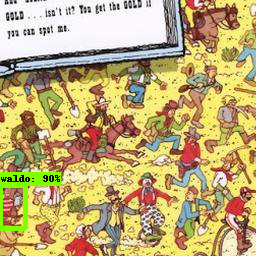

In [80]:
inference_with_plot(['workspace/data/test/waldo109.jpg'], box_th=.5)

Running inference for workspace/data/test/waldo5.jpg... 

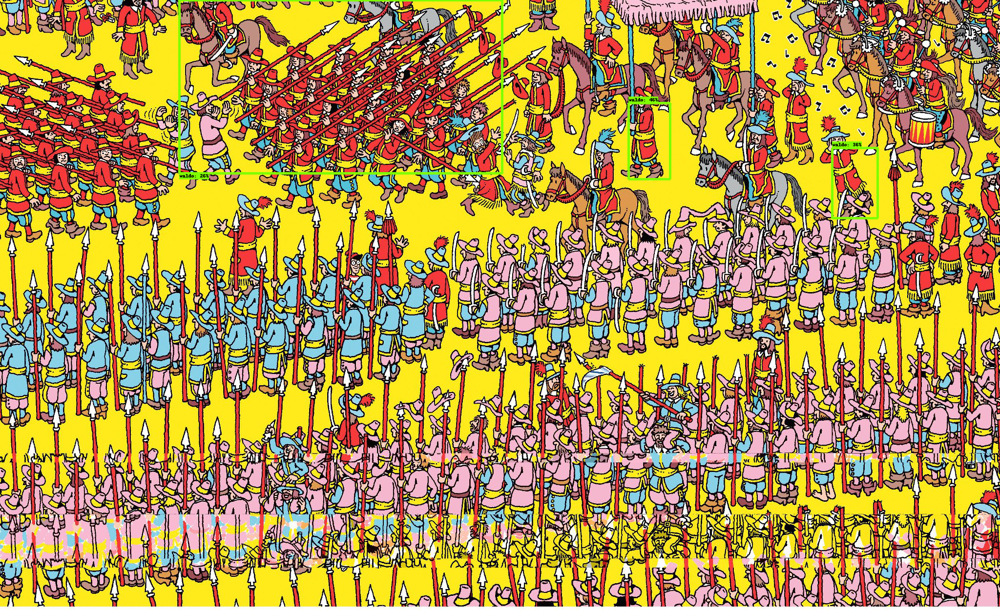

In [81]:
inference_with_plot(['workspace/data/test/waldo5.jpg'], box_th=.1)